### Checking environment

In [ ]:
!python --version
!conda --version
!which conda
!which python
!which jupyter
!which pip
!pip list

### List of dependencies

In [56]:
# dependencies
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt

formats = f'%Y-%m-%d %H-%M-%S'

### Dataframes timestamps of users entered and exited meetings

In [57]:
users = pd.read_csv('./csv_journal/bandwidth_timestamps.csv')
bandwidth_timestamps = pd.DataFrame(users)
users = bandwidth_timestamps['name'].unique()
bandwidth_timestamps

,name,type,gmeet_webcam_entered,gmeet_webcam_exited,gmeet_screen_entered,gmeet_screen_exited,zoom_webcam_entered,zoom_webcam_exited,zoom_screen_entered,zoom_screen_exited,siruntu_webcam_entered,siruntu_webcam_exited,siruntu_screen_entered,siruntu_screen_exited
0,presenter,presenter,2023-01-30 14:06:42,2023-01-30 14:32:59,2023-01-30 14:38:01,2023-01-30 15:06:53,2023-02-01 14:10:00,2023-02-01 14:37:39,2023-02-01 14:40:00,2023-02-01 15:06:51,2023-02-15 14:20:14,2023-02-15 14:48:00,2023-02-15 14:50:30,2023-02-15 15:20:15
1,viewer_1,viewer,2023-01-30 14:08:36,2023-01-30 14:32:59,2023-01-30 14:40:16,2023-01-30 15:06:53,2023-02-01 14:11:50,2023-02-01 14:37:39,2023-02-01 14:41:14,2023-02-01 15:06:51,2023-02-15 14:21:16,2023-02-15 14:48:00,2023-02-15 14:51:08,2023-02-15 15:20:15
2,viewer_2,viewer,2023-01-30 14:09:26,2023-01-30 14:32:59,2023-01-30 14:41:12,2023-01-30 15:06:53,2023-02-01 14:12:39,2023-02-01 14:37:39,2023-02-01 14:42:19,2023-02-01 15:06:51,2023-02-15 14:22:06,2023-02-15 14:48:00,2023-02-15 14:52:05,2023-02-15 15:20:15
3,viewer_3,viewer,2023-01-30 14:10:25,2023-01-30 14:32:59,2023-01-30 14:42:16,2023-01-30 15:06:53,2023-02-01 14:13:43,2023-02-01 14:37:39,2023-02-01 14:43:15,2023-02-01 15:06:51,2023-02-15 14:23:11,2023-02-15 14:48:00,2023-02-15 14:53:04,2023-02-15 15:20:15
4,viewer_4,viewer,2023-01-30 14:11:22,2023-01-30 14:32:59,2023-01-30 14:43:10,2023-01-30 15:06:53,2023-02-01 14:14:17,2023-02-01 14:37:39,2023-02-01 14:44:22,2023-02-01 15:06:51,2023-02-15 14:25:07,2023-02-15 14:48:00,2023-02-15 14:54:03,2023-02-15 15:20:15
5,viewer_5,viewer,2023-01-30 14:12:19,2023-01-30 14:32:59,2023-01-30 14:44:12,2023-01-30 15:06:53,2023-02-01 14:15:31,2023-02-01 14:37:39,2023-02-01 14:45:14,2023-02-01 15:06:51,2023-02-15 14:26:14,2023-02-15 14:48:00,2023-02-15 14:55:06,2023-02-15 15:20:15
6,viewer_6,viewer,2023-01-30 14:14:39,2023-01-30 14:32:59,2023-01-30 14:46:55,2023-01-30 15:06:53,2023-02-01 14:17:50,2023-02-01 14:37:39,2023-02-01 14:47:47,2023-02-01 15:06:51,2023-02-15 14:27:09,2023-02-15 14:48:00,2023-02-15 14:56:05,2023-02-15 15:20:15
7,viewer_7,viewer,2023-01-30 14:14:42,2023-01-30 14:32:59,2023-01-30 14:46:12,2023-01-30 15:06:53,2023-02-01 14:17:33,2023-02-01 14:37:39,2023-02-01 14:47:26,2023-02-01 15:06:51,2023-02-15 14:28:07,2023-02-15 14:48:00,2023-02-15 14:57:10,2023-02-15 15:20:15
8,viewer_8,viewer,2023-01-30 14:15:19,2023-01-30 14:32:59,2023-01-30 14:47:34,2023-01-30 15:06:53,2023-02-01 14:18:29,2023-02-01 14:37:39,2023-02-01 14:48:20,2023-02-01 15:06:51,2023-02-15 14:29:11,2023-02-15 14:48:00,2023-02-15 14:58:05,2023-02-15 15:20:15
9,viewer_9,viewer,2023-01-30 14:16:26,2023-01-30 14:32:59,2023-01-30 14:48:32,2023-01-30 15:06:53,2023-02-01 14:19:20,2023-02-01 14:37:39,2023-02-01 14:49:16,2023-02-01 15:06:51,2023-02-15 14:31:01,2023-02-15 14:48:00,2023-02-15 14:59:13,2023-02-15 15:20:15


### Client resources usage

#### Load files

In [58]:
# read csv file
bandwidth_df = pd.DataFrame()

for i in range(0, 16):
    name = i if i > 0 else 'presenter'
    folder = f'screenshots {str(name)}'
    filename_gmeet = '2023-01-30-gmeet.csv'
    filename_zoom = '2023-02-01-zoom.csv'
    filename_siruntu = '2023-02-15-siruntu.csv'
    path_gmeet = f'./csv_journal/bandwidth/{folder}/{filename_gmeet}'
    path_zoom = f'./csv_journal/bandwidth/{folder}/{filename_zoom}'
    path_siruntu = f'./csv_journal/bandwidth/{folder}/{filename_siruntu}'

    df_gmeet = pd.read_csv(path_gmeet)
    df_zoom = pd.read_csv(path_zoom)
    df_siruntu = pd.read_csv(path_siruntu)

    # rename columns with lower case and replace space with underscore
    df_gmeet.columns = df_gmeet.columns.str.lower().str.replace(' ', '_')
    df_zoom.columns = df_zoom.columns.str.lower().str.replace(' ', '_')
    df_siruntu.columns = df_siruntu.columns.str.lower().str.replace(' ', '_')

    # add column to dataframe
    df_gmeet['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_gmeet['app'] = 'gmeet'
    df_zoom['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_zoom['app'] = 'zoom'
    df_siruntu['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_siruntu['app'] = 'siruntu'

    # filter by column File that non contain NaN
    df_gmeet = df_gmeet[df_gmeet['file'].notna()]
    df_zoom = df_zoom[df_zoom['file'].notna()]
    df_siruntu = df_siruntu[df_siruntu['file'].notna()]

    # filter by column Protocol that contain string 'UDP'
    df_gmeet = df_gmeet[df_gmeet['protocol'].str.contains('UDP')]
    df_zoom = df_zoom[df_zoom['protocol'].str.contains('UDP')]
    df_siruntu = df_siruntu[df_siruntu['protocol'].str.contains('UDP')]

    # filter by column file that contain string 'chrome'
    df_gmeet = df_gmeet[df_gmeet['file'].str.contains('chrome')]
    df_zoom = df_zoom[df_zoom['file'].str.contains('chrome')]
    df_siruntu = df_siruntu[df_siruntu['file'].str.contains('chrome')]

    # convert to datetime
    df_gmeet['time'] = pd.to_datetime(
        df_gmeet['time'], format=formats)
    df_zoom['time'] = pd.to_datetime(
        df_zoom['time'], format=formats)
    df_siruntu['time'] = pd.to_datetime(
        df_siruntu['time'], format=formats)

    # concatenate dataframe
    bandwidth_df = pd.concat([bandwidth_df, df_gmeet, df_zoom, df_siruntu])

bandwidth_df

,time,event,pid,file,directory,ip,port,country,download_(bytes),upload_(bytes),protocol,user,app
274,2023-01-30 15:44:23,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,1614,3413,UDP,presenter,gmeet
286,2023-01-30 15:44:22,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,697,326,UDP,presenter,gmeet
292,2023-01-30 15:44:21,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,11300,25843,UDP,presenter,gmeet
302,2023-01-30 15:44:20,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,214,103,UDP,presenter,gmeet
314,2023-01-30 15:44:19,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,103,103,UDP,presenter,gmeet
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23221,2023-02-15 13:53:41,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23228,2023-02-15 13:53:40,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23543,2023-02-15 13:51:45,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23552,2023-02-15 13:51:44,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu


#### Segmented dataframes

In [59]:
gmeet = bandwidth_df[bandwidth_df['app'] == 'gmeet']
zoom = bandwidth_df[bandwidth_df['app'] == 'zoom']
siruntu = bandwidth_df[bandwidth_df['app'] == 'siruntu']

gmeet = gmeet.groupby(['time', 'user']).sum()
zoom = zoom.groupby(['time', 'user']).sum()
siruntu = siruntu.groupby(['time', 'user']).sum()

gmeet = gmeet.reset_index()
zoom = zoom.reset_index()
siruntu = siruntu.reset_index()

# add column from index
gmeet['index'] = gmeet.index
zoom['index'] = zoom.index
siruntu['index'] = siruntu.index

/tmp/ipykernel_415476/259675416.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gmeet = gmeet.groupby(['time', 'user']).sum()
/tmp/ipykernel_415476/259675416.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  zoom = zoom.groupby(['time', 'user']).sum()
/tmp/ipykernel_415476/259675416.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  siruntu = siruntu.groupby(['time', 'user']).sum()


#### Throughput (download and upload) in client side

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

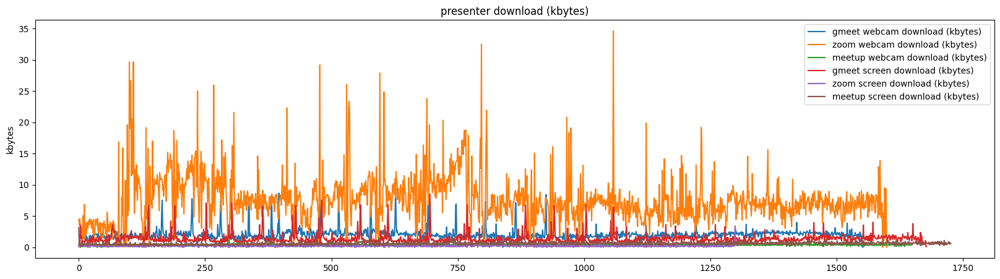

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

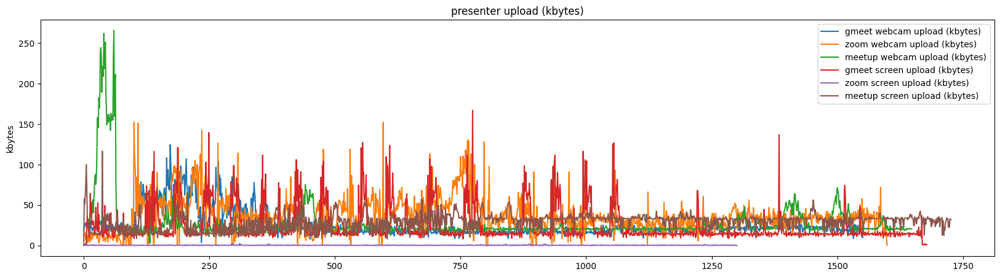

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

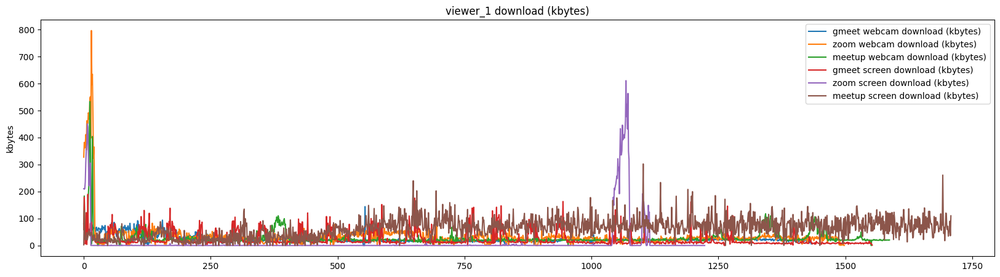

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

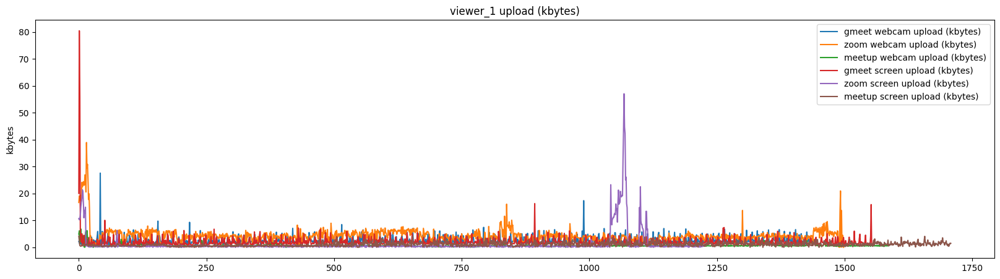

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

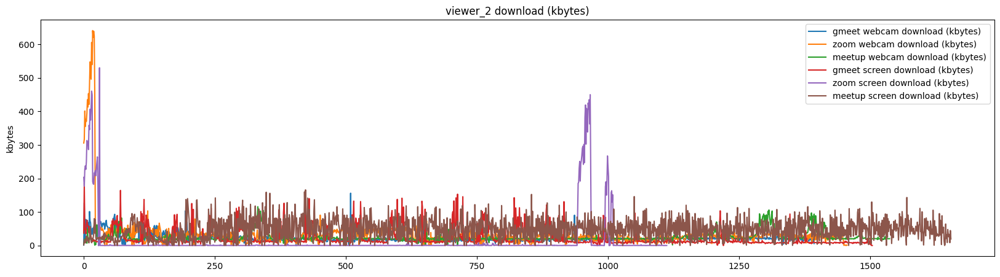

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

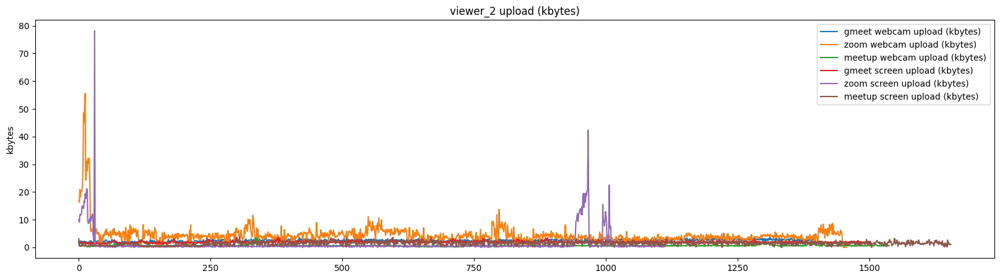

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

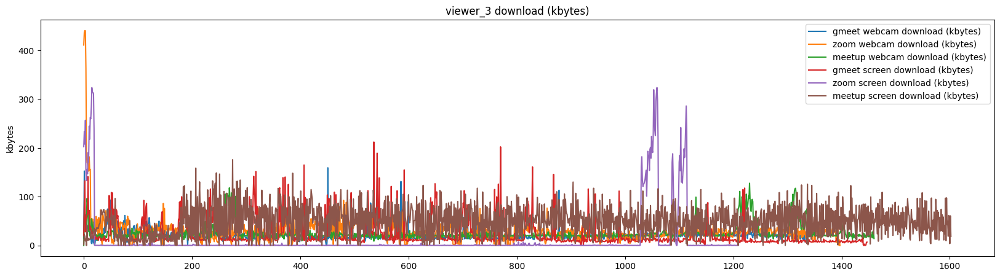

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

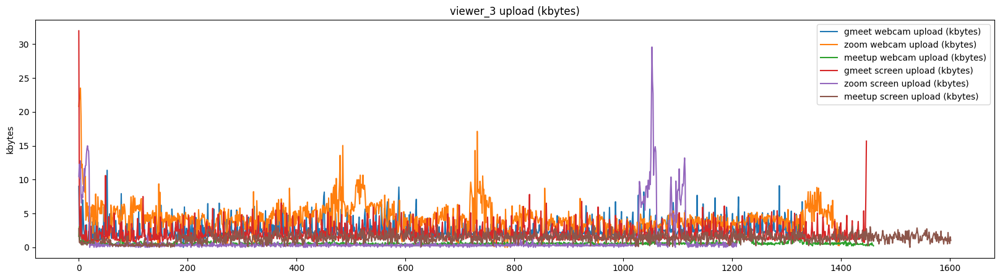

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

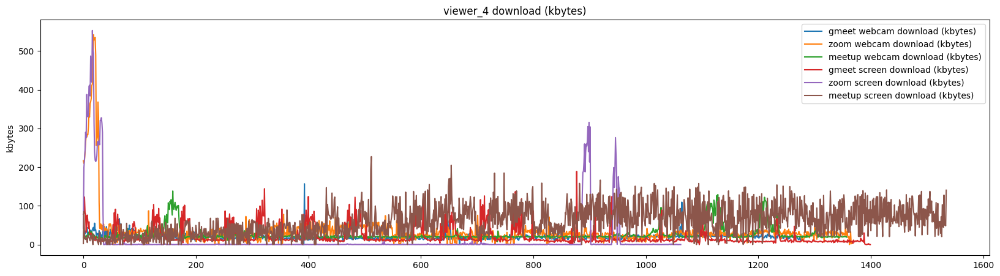

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

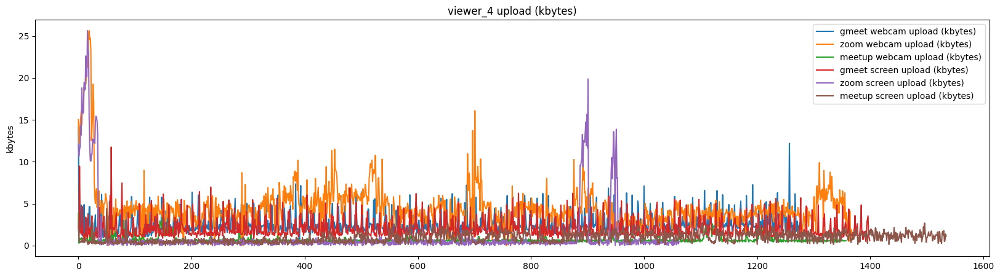

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

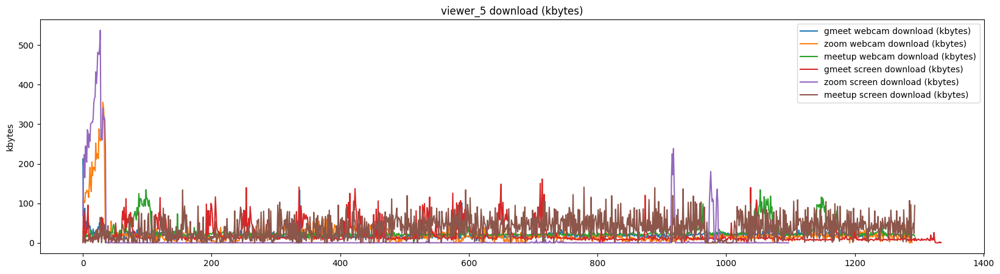

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

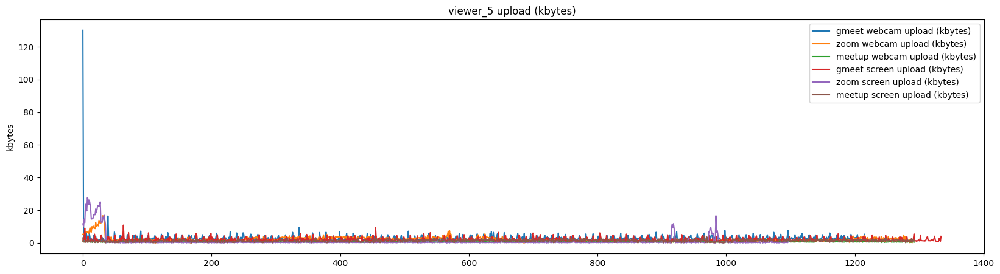

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

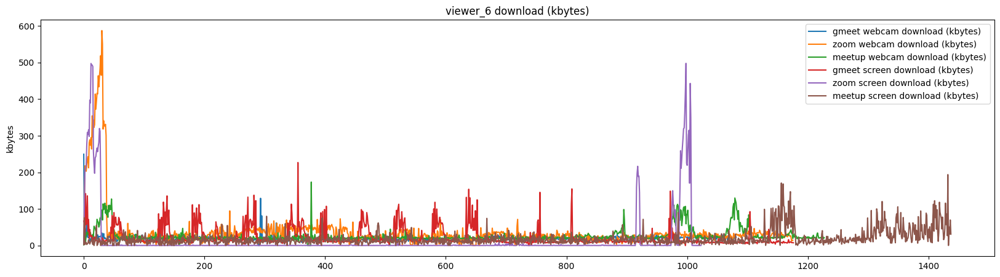

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

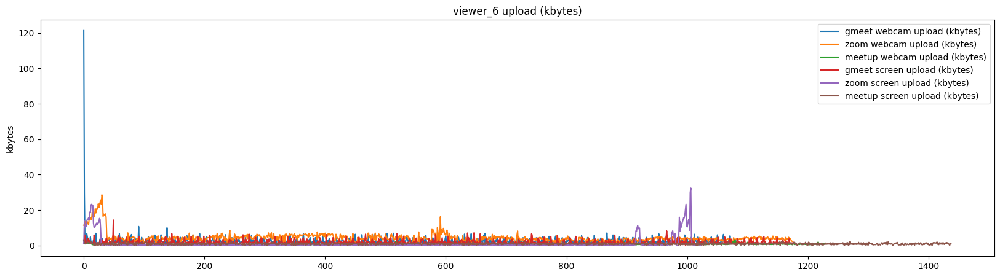

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

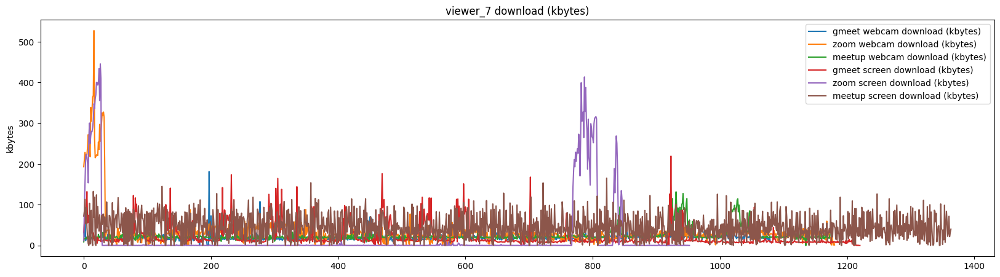

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

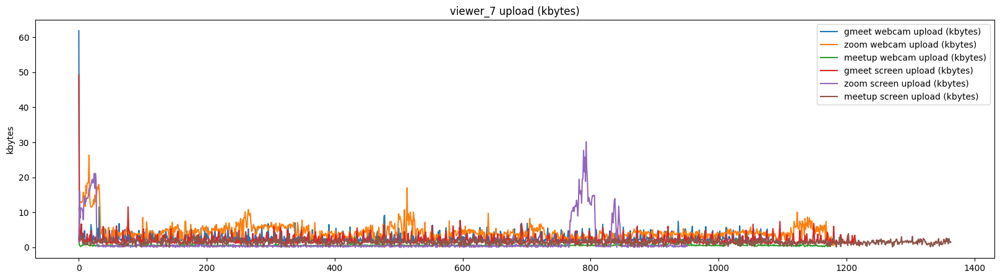

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

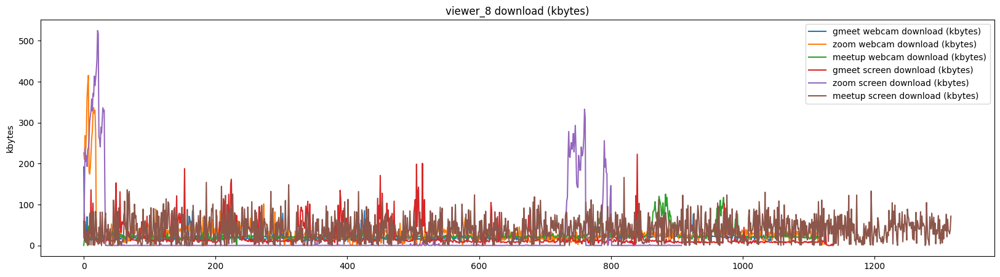

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

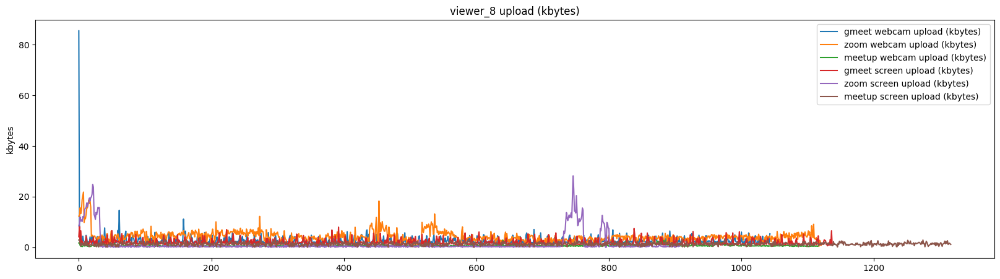

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

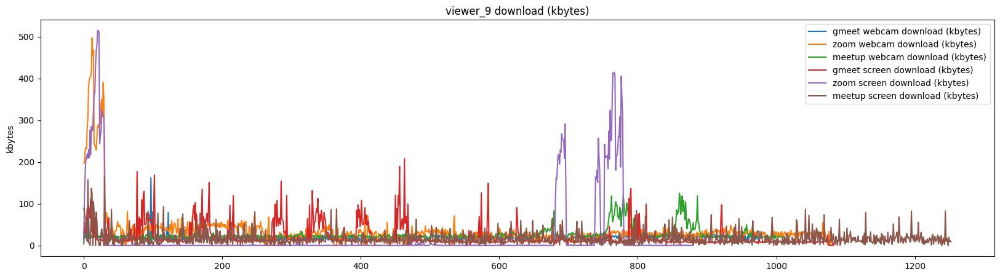

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

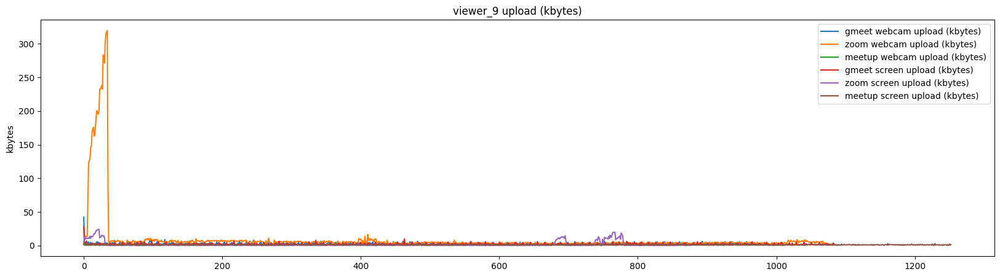

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

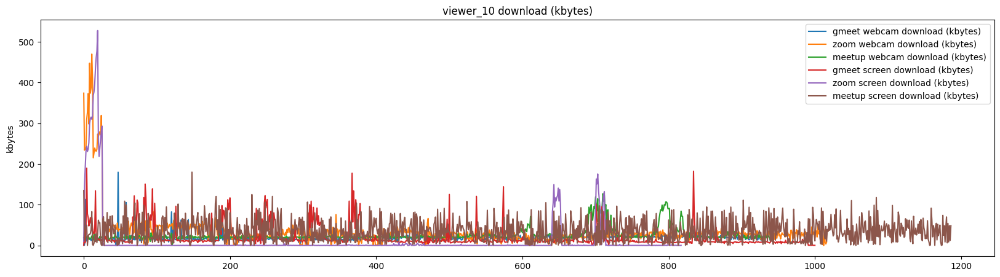

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

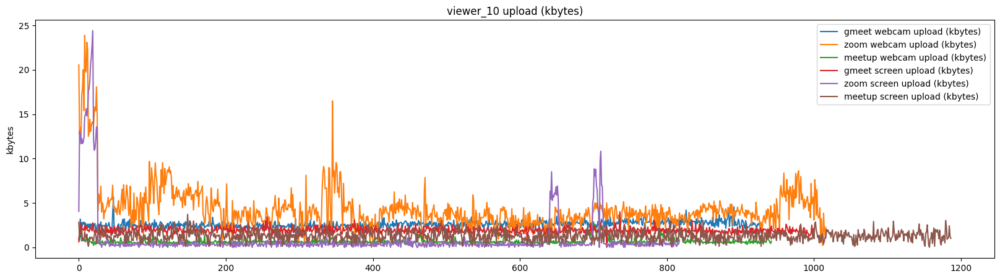

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

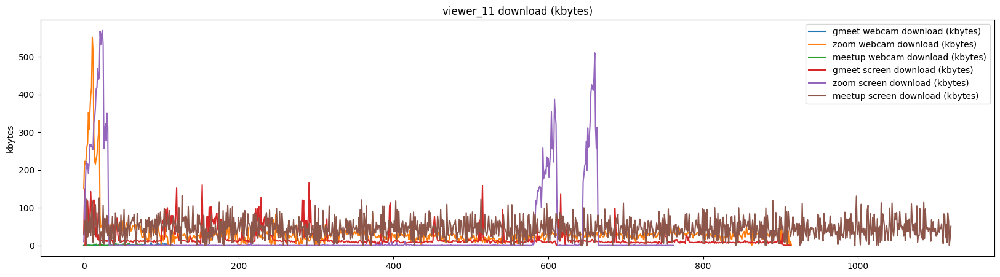

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

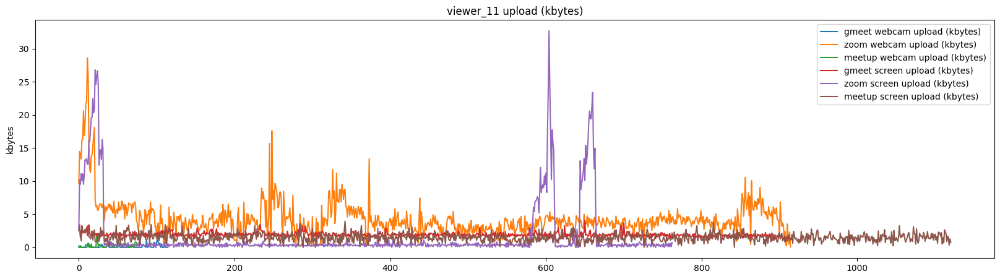

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

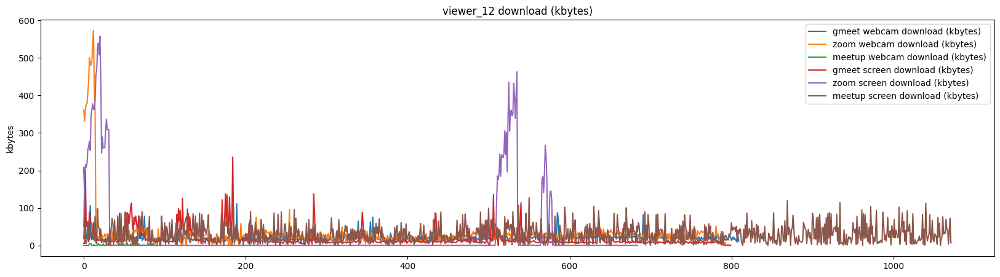

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

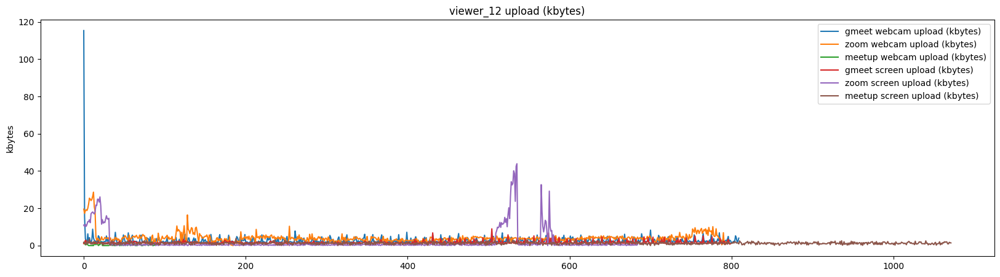

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

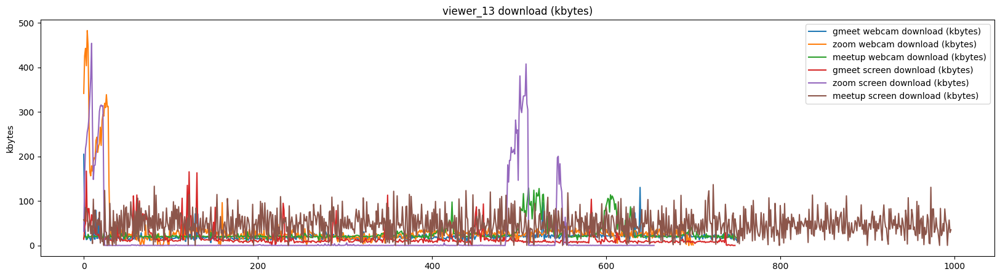

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

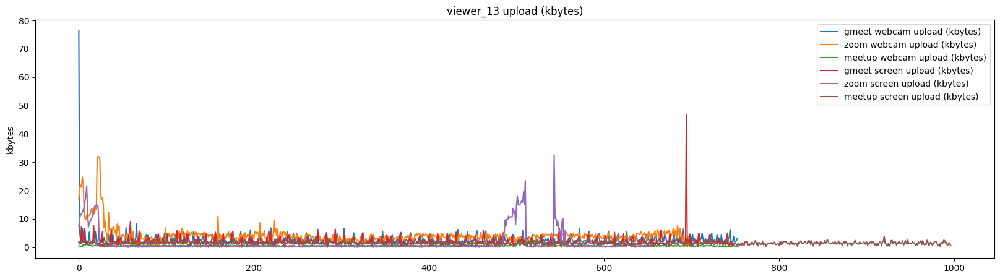

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

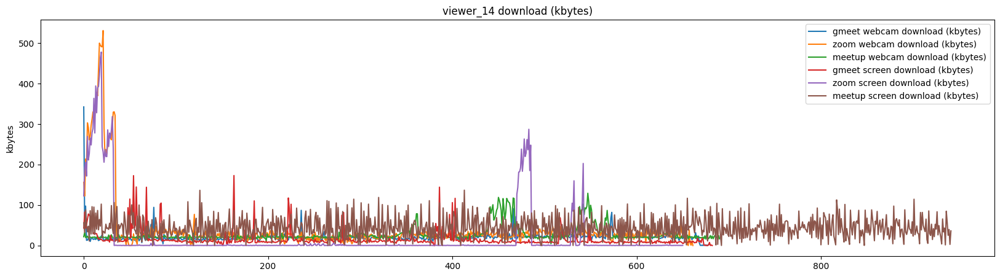

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

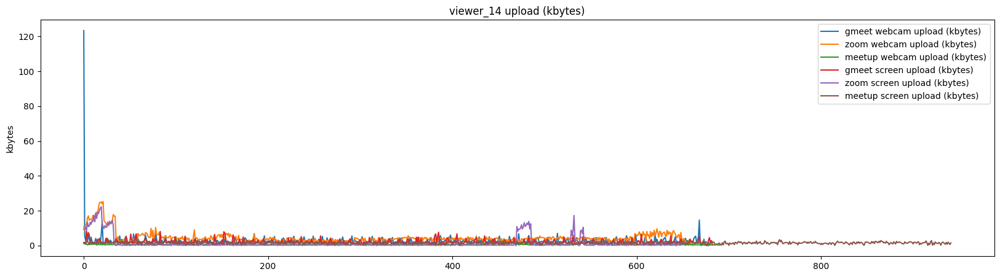

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

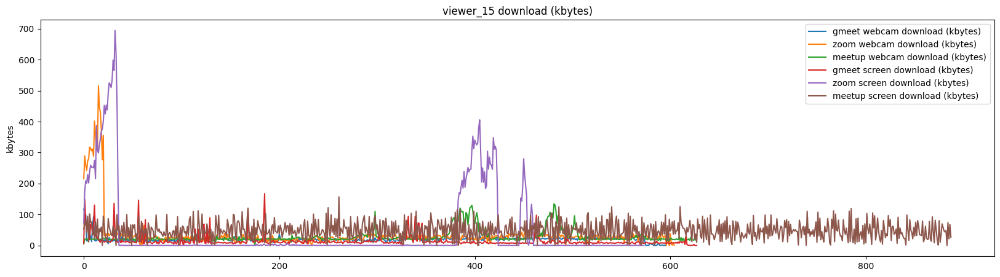

/tmp/ipykernel_415476/2202389112.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gmeet_user['index'] = gmeet_user.index
/tmp/ipykernel_415476/2202389112.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zoom_user['index'] = zoom_user.index
/tmp/ipykernel_415476/2202389112.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

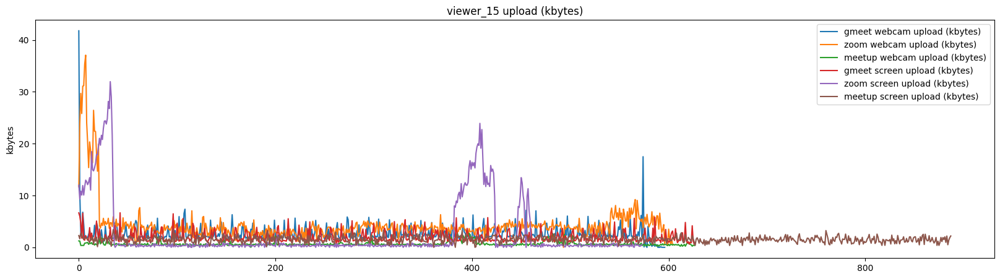

In [60]:
client_throughput_summary = pd.DataFrame()
for user in users:
    for bt in ['download_(bytes)', 'upload_(bytes)']:
        # for ms in ['webcam', 'screen']:
        user_timestamps = bandwidth_timestamps[bandwidth_timestamps['name'] == user].iloc[0]
        gmeet_user = gmeet[gmeet['user'] == user]
        zoom_user = zoom[zoom['user'] == user]
        siruntu_user = siruntu[siruntu['user'] == user]

        # ms_entered = f'{ms}_entered'
        # ms_exited = f'{ms}_exited'
        webcam_entered = f'webcam_entered'
        webcam_exited = f'webcam_exited'
        screen_entered = f'screen_entered'
        screen_exited = f'screen_exited'

        # gmeet_user = gmeet_user[(gmeet_user['time'] >= user_timestamps[f'gmeet_{ms_entered}']) & (gmeet_user['time'] <= user_timestamps[f'gmeet_{ms_exited}'])]
        # zoom_user = zoom_user[(zoom_user['time'] >= user_timestamps[f'zoom_{ms_entered}']) & (zoom_user['time'] <= user_timestamps[f'zoom_{ms_exited}'])]
        # siruntu_user = siruntu_user[(siruntu_user['time'] >= user_timestamps[f'siruntu_{ms_entered}']) & (siruntu_user['time'] <= user_timestamps[f'siruntu_{ms_exited}'])]

        gmeet_user_webcam = gmeet_user[(gmeet_user['time'] >= user_timestamps[f'gmeet_{webcam_entered}']) & (gmeet_user['time'] <= user_timestamps[f'gmeet_{webcam_exited}'])]
        zoom_user_webcam = zoom_user[(zoom_user['time'] >= user_timestamps[f'zoom_{webcam_entered}']) & (zoom_user['time'] <= user_timestamps[f'zoom_{webcam_exited}'])]
        siruntu_user_webcam = siruntu_user[(siruntu_user['time'] >= user_timestamps[f'siruntu_{webcam_entered}']) & (siruntu_user['time'] <= user_timestamps[f'siruntu_{webcam_exited}'])]

        gmeet_user_screen = gmeet_user[(gmeet_user['time'] >= user_timestamps[f'gmeet_{screen_entered}']) & (gmeet_user['time'] <= user_timestamps[f'gmeet_{screen_exited}'])]
        zoom_user_screen = zoom_user[(zoom_user['time'] >= user_timestamps[f'zoom_{screen_entered}']) & (zoom_user['time'] <= user_timestamps[f'zoom_{screen_exited}'])]
        siruntu_user_screen = siruntu_user[(siruntu_user['time'] >= user_timestamps[f'siruntu_{screen_entered}']) & (siruntu_user['time'] <= user_timestamps[f'siruntu_{screen_exited}'])]

        # gmeet_user = gmeet_user.reset_index(drop=True)
        # zoom_user = zoom_user.reset_index(drop=True)
        # siruntu_user = siruntu_user.reset_index(drop=True)

        gmeet_user_webcam = gmeet_user_webcam.reset_index(drop=True)
        zoom_user_webcam = zoom_user_webcam.reset_index(drop=True)
        siruntu_user_webcam = siruntu_user_webcam.reset_index(drop=True)

        gmeet_user_screen = gmeet_user_screen.reset_index(drop=True)
        zoom_user_screen = zoom_user_screen.reset_index(drop=True)
        siruntu_user_screen = siruntu_user_screen.reset_index(drop=True)

        gmeet_user['index'] = gmeet_user.index
        zoom_user['index'] = zoom_user.index
        siruntu_user['index'] = siruntu_user.index

        gmeet_user_webcam['index'] = gmeet_user_webcam.index
        zoom_user_webcam['index'] = zoom_user_webcam.index
        siruntu_user_webcam['index'] = siruntu_user_webcam.index

        gmeet_user_screen['index'] = gmeet_user_screen.index
        zoom_user_screen['index'] = zoom_user_screen.index
        siruntu_user_screen['index'] = siruntu_user_screen.index

        # convert bytes to kbytes
        # gmeet_user[bt] = gmeet_user[bt] / 1024
        # zoom_user[bt] = zoom_user[bt] / 1024
        # siruntu_user[bt] = siruntu_user[bt] / 1024

        gmeet_user_webcam[bt] = gmeet_user_webcam[bt] / 1024
        zoom_user_webcam[bt] = zoom_user_webcam[bt] / 1024
        siruntu_user_webcam[bt] = siruntu_user_webcam[bt] / 1024

        gmeet_user_screen[bt] = gmeet_user_screen[bt] / 1024
        zoom_user_screen[bt] = zoom_user_screen[bt] / 1024
        siruntu_user_screen[bt] = siruntu_user_screen[bt] / 1024

        gmeet_min = gmeet_user[bt].min()
        zoom_min = zoom_user[bt].min()
        siruntu_min = siruntu_user[bt].min()

        gmeet_max = gmeet_user[bt].max()
        zoom_max = zoom_user[bt].max()
        siruntu_max = siruntu_user[bt].max()

        gmeet_mean = gmeet_user[bt].mean()
        zoom_mean = zoom_user[bt].mean()
        siruntu_mean = siruntu_user[bt].mean()

        types = bt.replace("_", " ")
        types = types.replace("(bytes)", "(kbytes)")
        plt.title(f'{user} {types}')
        # plt.plot(gmeet_user['index'], gmeet_user[bt], label=f'gmeet {ms} {types}')
        # plt.plot(zoom_user['index'], zoom_user[bt], label=f'zoom {ms} {types}')
        # plt.plot(siruntu_user['index'], siruntu_user[bt], label=f'meetup {ms} {types}')

        plt.plot(gmeet_user_webcam['index'], gmeet_user_webcam[bt], label=f'gmeet webcam {types}')
        plt.plot(zoom_user_webcam['index'], zoom_user_webcam[bt], label=f'zoom webcam {types}')
        plt.plot(siruntu_user_webcam['index'], siruntu_user_webcam[bt], label=f'meetup webcam {types}')

        plt.plot(gmeet_user_screen['index'], gmeet_user_screen[bt], label=f'gmeet screen {types}')
        plt.plot(zoom_user_screen['index'], zoom_user_screen[bt], label=f'zoom screen {types}')
        plt.plot(siruntu_user_screen['index'], siruntu_user_screen[bt], label=f'meetup screen {types}')

        plt.ylabel('kbytes')
        plt.legend()
        plt.gcf().set_size_inches(20, 5)
        plt.savefig(f'./plot_journal/throughput_{user}_{bt}.jpg')
        plt.show()

        # client_throughput_summary = pd.concat([client_throughput_summary, pd.DataFrame({
        #     'user': user,
        #     'type': types,
        #     'gmeet_min': "%.2f" % gmeet_min,
        #     'zoom_min': "%.2f" % zoom_min,
        #     'meetup_min': "%.2f" % siruntu_min,
        #     'gmeet_max': "%.2f" % gmeet_max,
        #     'zoom_max': "%.2f" % zoom_max,
        #     'meetup_max': "%.2f" % siruntu_max,
        #     'gmeet_avg': "%.2f" % gmeet_mean,
        #     'zoom_avg': "%.2f" %zoom_mean,
        #     'meetup_avg': "%.2f" % siruntu_mean,
        # }, index=[0])])

In [61]:
# summary = client_throughput_summary
# summary.columns = summary.columns.str.replace('_', ' ')
# summary.columns = summary.columns.str.title()

# summary.to_csv('./summary/case_1_client_throughput_summary.csv', index=False)
# client_throughput_summary

#### CPU and RAM in client side

In [62]:
import os

f = './csv_journal/ram_cpu'
list_files = os.listdir(f)

# remove "CPU RAM - server_siruntu.csv" from list_folder
list_files.remove('CPU RAM - server_siruntu.csv')
# list_files

ram_cpu_df = pd.DataFrame()

for fil in list_files:
    df = pd.read_csv(f'{f}/{fil}')
    ram_cpu_df = pd.concat([ram_cpu_df, df])

ram_cpu_df = ram_cpu_df.drop(columns=['emial'])
ram_cpu_df['time'] = pd.to_datetime(ram_cpu_df['time'], format='%d/%m/%Y %H:%M:%S')
ram_cpu_df['memory'] = ram_cpu_df['memory'].astype(int)
ram_cpu_df['memory'] = (ram_cpu_df['memory'] / 1024).round(2)
ram_cpu_df['cpu'] = ram_cpu_df['cpu'].astype(float)

ram_cpu_df

,time,memory,cpu,app,media,user
0,2023-01-30 14:22:17,155.75,68.8,gmeet,webcam,viewer_15
1,2023-01-30 14:23:00,149.68,14.1,gmeet,webcam,viewer_15
2,2023-01-30 14:24:00,154.29,12.5,gmeet,webcam,viewer_15
3,2023-01-30 14:25:00,153.26,28.1,gmeet,webcam,viewer_15
4,2023-01-30 14:26:00,146.29,12.5,gmeet,webcam,viewer_15
...,...,...,...,...,...,...
49,2023-02-15 15:16:00,67.08,15.5,siruntu,screen,viewer_3
50,2023-02-15 15:17:00,66.44,1.6,siruntu,screen,viewer_3
51,2023-02-15 15:18:00,66.55,4.7,siruntu,screen,viewer_3
52,2023-02-15 15:19:00,66.29,1.6,siruntu,screen,viewer_3


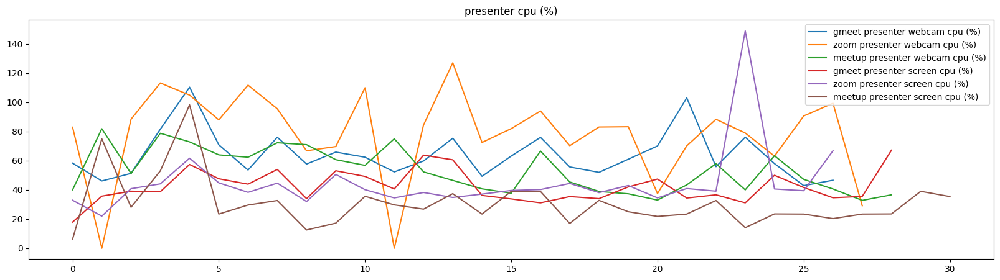

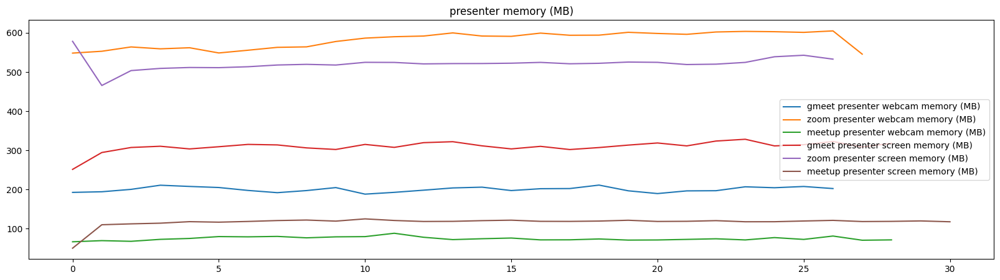

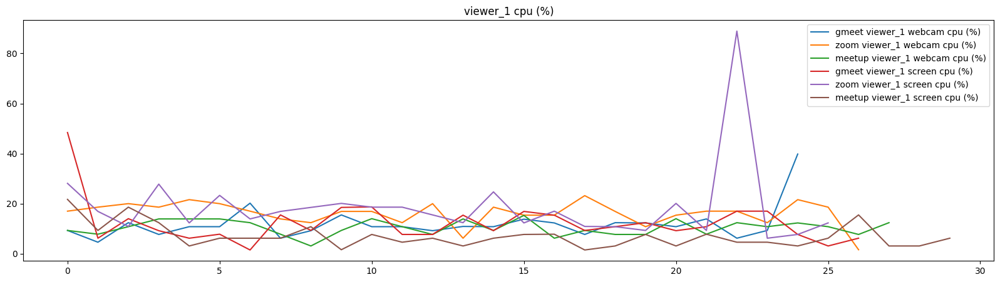

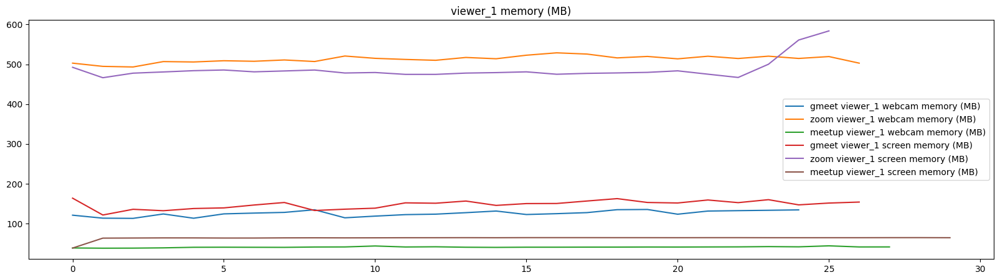

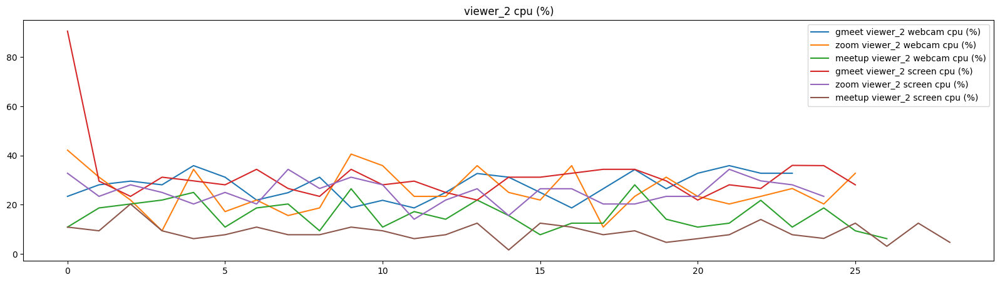

...

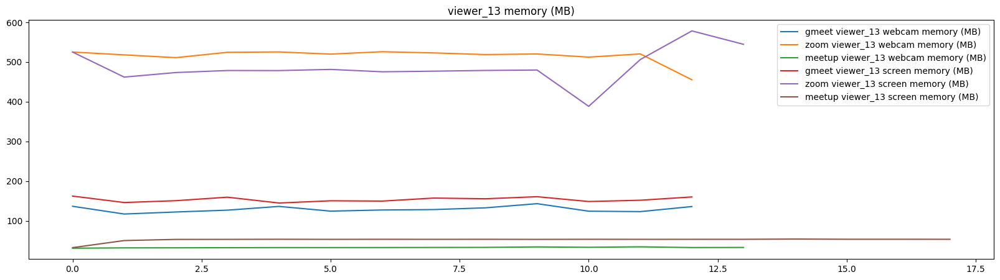

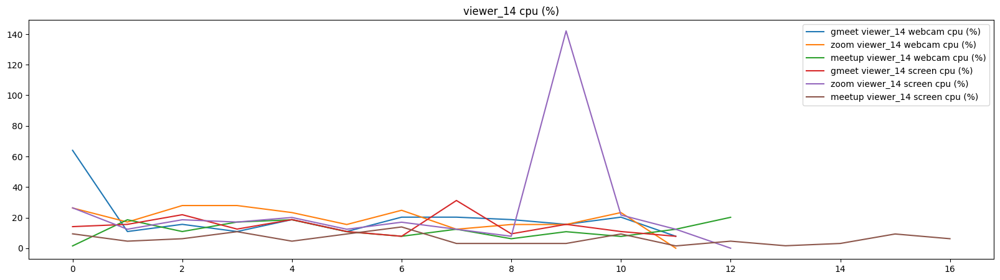

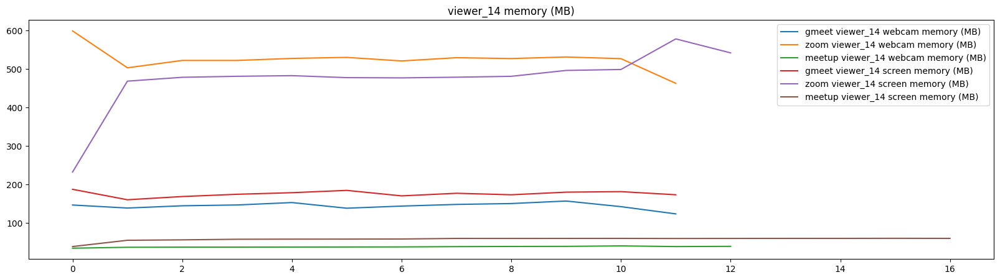

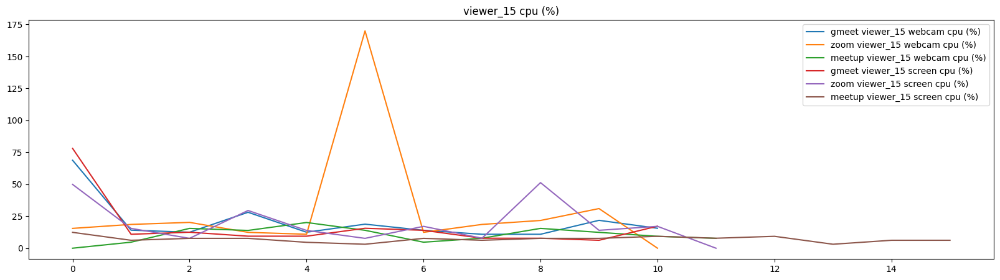

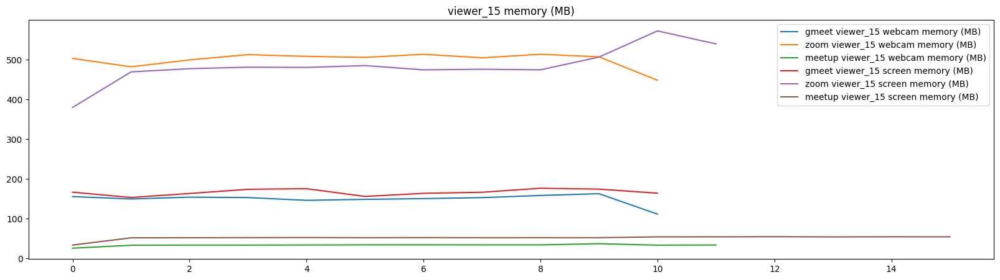

In [63]:
for user in users:
    for rs in ['cpu', 'memory']:
        # for ms in ['webcam', 'screen']:
        ram_cpu_user = ram_cpu_df[ram_cpu_df['user'] == user]

        gmeet_resource_webcam = ram_cpu_user[(ram_cpu_user['app'] == 'gmeet') & (ram_cpu_user['media'] == 'webcam')].reset_index(drop=True)
        zoom_resource_webcam = ram_cpu_user[(ram_cpu_user['app'] == 'zoom') & (ram_cpu_user['media'] == 'webcam')].reset_index(drop=True)
        siruntu_resource_webcam = ram_cpu_user[(ram_cpu_user['app'] == 'siruntu') & (ram_cpu_user['media'] == 'webcam')].reset_index(drop=True)
        gmeet_resource_screen = ram_cpu_user[(ram_cpu_user['app'] == 'gmeet') & (ram_cpu_user['media'] == 'screen')].reset_index(drop=True)
        zoom_resource_screen = ram_cpu_user[(ram_cpu_user['app'] == 'zoom') & (ram_cpu_user['media'] == 'screen')].reset_index(drop=True)
        siruntu_resource_screen = ram_cpu_user[(ram_cpu_user['app'] == 'siruntu') & (ram_cpu_user['media'] == 'screen')].reset_index(drop=True)

        gmeet_resource_webcam['index'] = gmeet_resource_webcam.index
        zoom_resource_webcam['index'] = zoom_resource_webcam.index
        siruntu_resource_webcam['index'] = siruntu_resource_webcam.index
        gmeet_resource_screen['index'] = gmeet_resource_screen.index
        zoom_resource_screen['index'] = zoom_resource_screen.index
        siruntu_resource_screen['index'] = siruntu_resource_screen.index

        unit = '(MB)' if rs == 'memory' else '(%)'
        plt.title(f'{user} {rs} {unit}')
        plt.plot(gmeet_resource_webcam['index'], gmeet_resource_webcam[rs], label=f'gmeet {user} webcam {rs} {unit}')
        plt.plot(zoom_resource_webcam['index'], zoom_resource_webcam[rs], label=f'zoom {user} webcam {rs} {unit}')
        plt.plot(siruntu_resource_webcam['index'], siruntu_resource_webcam[rs], label=f'meetup {user} webcam {rs} {unit}')
        plt.plot(gmeet_resource_screen['index'], gmeet_resource_screen[rs], label=f'gmeet {user} screen {rs} {unit}')
        plt.plot(zoom_resource_screen['index'], zoom_resource_screen[rs], label=f'zoom {user} screen {rs} {unit}')
        plt.plot(siruntu_resource_screen['index'], siruntu_resource_screen[rs], label=f'meetup {user} screen {rs} {unit}')

        plt.legend()
        plt.gcf().set_size_inches(20, 5)
        plt.savefig(f'./plot_journal/cpu_memory_{user}_{rs}.jpg')
        plt.show()

In [64]:
# client_cpu_ram_summary.to_csv('client_cpu_bandwidth_summary.csv', index=False)
# summary_cpu_ram = client_cpu_ram_summary
# summary_cpu_ram.columns = summary_cpu_ram.columns.str.replace('_', ' ')
# summary_cpu_ram.columns = summary_cpu_ram.columns.str.title()
# summary_cpu_ram.to_csv('./summary/case_1_client_cpu_ram_summary.csv', index=False)

# summary_cpu_ram

### Server  usage resources

#### Load files

In [65]:
files = './csv_journal/ram_cpu/CPU RAM - server_siruntu.csv'

df = pd.read_csv(files)
df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y %H:%M:%S')
df['memory'] = df['memory'].astype(int)
df['memory'] = (df['memory'] / 1024).round(2)
df['cpu'] = df['cpu'].astype(float)

# # remove "," from donwload and upload columns dan replace with "."
# df['download (bytes)'] = df['download (bytes)'].str.replace(
#     ',', '.').astype(float)
# df['upload (bytes)'] = df['upload (bytes)'].str.replace(',', '.').astype(float)
# convert bytes to kbytes

df['download (bytes)'] = (df['download (bytes)'] / 1024).round(2)
df['upload (bytes)'] = (df['upload (bytes)'] / 1024).round(2)
# rename columns
df = df.rename(columns={'download (bytes)': 'download (kbytes)',
               'upload (bytes)': 'upload (kbytes)'})
df

,time,memory,cpu,download (kbytes),upload (kbytes),app,media,user,download,upload,download (unit),upload (unit),client
0,2023-02-15 14:20:14,30.02,0.01,0.15,0.46,siruntu,webcam,server,1.22,3.74,k,k,presenter
1,2023-02-15 14:21:00,34.21,1.68,21.16,21.83,siruntu,webcam,server,173.38,178.84,k,k,viewer 1
2,2023-02-15 14:22:00,35.41,2.59,54.08,60.94,siruntu,webcam,server,442.99,499.21,k,k,viewer 2
3,2023-02-15 14:23:00,38.75,3.04,44.33,172.12,siruntu,webcam,server,363.19,1410.00,k,k,viewer 3
4,2023-02-15 14:25:00,40.93,3.49,25.92,64.68,siruntu,webcam,server,212.34,529.85,k,k,viewer 4
5,2023-02-15 14:26:00,43.22,3.85,20.01,70.70,siruntu,webcam,server,163.91,579.16,k,k,viewer 5
6,2023-02-15 14:27:00,46.41,4.01,30.66,202.64,siruntu,webcam,server,251.14,1660.00,k,k,viewer 6
7,2023-02-15 14:28:00,50.22,5.54,38.90,222.17,siruntu,webcam,server,318.64,1820.00,k,k,viewer 7
8,2023-02-15 14:29:00,52.85,5.40,25.04,146.48,siruntu,webcam,server,205.13,1200.00,k,k,viewer 8
9,2023-02-15 14:31:00,58.53,7.27,23.23,146.48,siruntu,webcam,server,190.32,1200.00,k,k,viewer 9


#### RAM

/tmp/ipykernel_415476/2921909166.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_webcam['index'] = df_media_webcam.index
/tmp/ipykernel_415476/2921909166.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_screen['index'] = df_media_screen.index


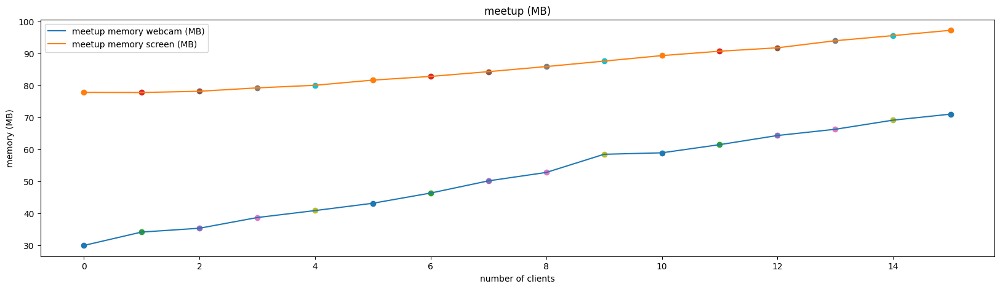

In [66]:
unit = '(MB)'

df_media_webcam = df[df['media'] == 'webcam']
df_media_webcam.reset_index(drop=True, inplace=True)
df_media_webcam['index'] = df_media_webcam.index
df_media_screen = df[df['media'] == 'screen']
df_media_screen.reset_index(drop=True, inplace=True)
df_media_screen['index'] = df_media_screen.index

plt.title(f'meetup {unit}')
plt.xlabel("number of clients")
plt.ylabel("memory (MB)")

plt.plot(df_media_webcam['index'], df_media_webcam['memory'],
            label=f'meetup memory webcam {unit}')
plt.plot(df_media_screen['index'], df_media_screen['memory'],
            label=f'meetup memory screen {unit}')


clients = df_media_webcam['client']
for idx, x in enumerate(clients):
    plt.scatter(df_media_webcam['index'][idx], df_media_webcam['memory'][idx])
    plt.scatter(df_media_screen['index'][idx], df_media_screen['memory'][idx])

plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.savefig(f'./plot_journal/server_memory.jpg')
plt.show()

#### CPU

/tmp/ipykernel_415476/2689929612.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_webcam['index'] = df_media_webcam.index
/tmp/ipykernel_415476/2689929612.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_screen['index'] = df_media_screen.index


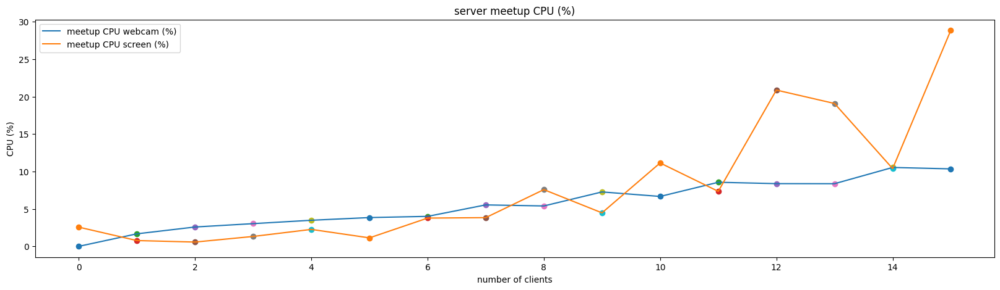

In [67]:
df_media_webcam = df[df['media'] == 'webcam']
df_media_screen = df[df['media'] == 'screen']
df_media_webcam.reset_index(drop=True, inplace=True)
df_media_screen.reset_index(drop=True, inplace=True)
df_media_webcam['index'] = df_media_webcam.index
df_media_screen['index'] = df_media_screen.index

plt.title(f'server meetup CPU (%)')
plt.xlabel("number of clients")
plt.ylabel("CPU (%)")

plt.plot(df_media_webcam['index'], df_media_webcam['cpu'], label=f'meetup CPU webcam (%)')
plt.plot(df_media_screen['index'], df_media_screen['cpu'], label=f'meetup CPU screen (%)')

clients = df_media_webcam['client']
for idx, x in enumerate(clients):
    plt.scatter(df_media_webcam['index'][idx], df_media_webcam['cpu'][idx])
    plt.scatter(df_media_screen['index'][idx], df_media_screen['cpu'][idx])

plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.savefig(f'./plot_journal/server_cpu.jpg')
plt.show()

#### Throughput (download and upload) in Server

/tmp/ipykernel_415476/3127421754.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_webcam['index'] = df_media_webcam.index
/tmp/ipykernel_415476/3127421754.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_screen['index'] = df_media_screen.index


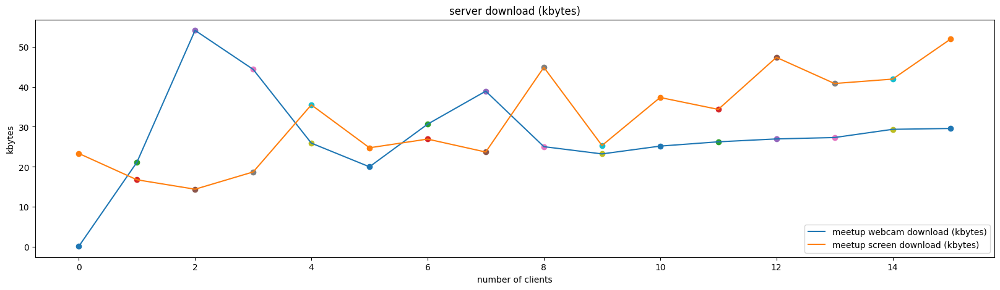

/tmp/ipykernel_415476/3127421754.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_webcam['index'] = df_media_webcam.index
/tmp/ipykernel_415476/3127421754.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_media_screen['index'] = df_media_screen.index


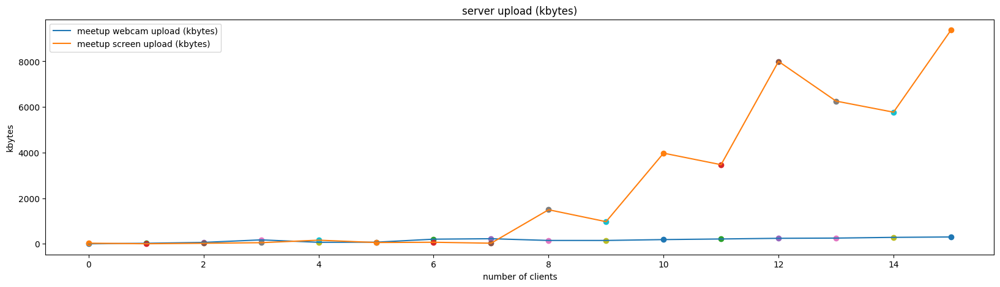

In [68]:
for bt in ['download (kbytes)', 'upload (kbytes)']:
    df_media_webcam = df[(df['media'] == 'webcam')]
    df_media_screen = df[(df['media'] == 'screen')]
    df_media_webcam.reset_index(drop=True, inplace=True)
    df_media_screen.reset_index(drop=True, inplace=True)
    df_media_webcam['index'] = df_media_webcam.index
    df_media_screen['index'] = df_media_screen.index


    plt.title(f'server {bt}')
    plt.xlabel("number of clients")
    plt.ylabel("kbytes")

    plt.plot(df_media_webcam['index'], df_media_webcam[bt], label=f'meetup webcam {bt}')
    plt.plot(df_media_screen['index'], df_media_screen[bt], label=f'meetup screen {bt}')

    clients = df_media_webcam['client']
    for idx, x in enumerate(clients):
        plt.scatter(df_media_webcam['index'][idx], df_media_webcam[bt][idx])
        plt.scatter(df_media_screen['index'][idx], df_media_screen[bt][idx])

    plt.legend()
    plt.gcf().set_size_inches(20, 5)
    plt.savefig(f'./plot_journal/server_{bt}.jpg')

    plt.show()